#  IN3050/IN4050 Mandatory Assignment 1: Traveling Salesman Problem


In [2]:
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline
np.random.seed(57)
#Map of Europe
europe_map = plt.imread('map.png')

#Lists of city coordinates
city_coords = {
    "Barcelona": [2.154007, 41.390205], "Belgrade": [20.46, 44.79], "Berlin": [13.40, 52.52], 
    "Brussels": [4.35, 50.85], "Bucharest": [26.10, 44.44], "Budapest": [19.04, 47.50],
    "Copenhagen": [12.57, 55.68], "Dublin": [-6.27, 53.35], "Hamburg": [9.99, 53.55], 
    "Istanbul": [28.98, 41.02], "Kyiv": [30.52, 50.45], "London": [-0.12, 51.51], 
    "Madrid": [-3.70, 40.42], "Milan": [9.19, 45.46], "Moscow": [37.62, 55.75],
    "Munich": [11.58, 48.14], "Paris": [2.35, 48.86], "Prague": [14.42, 50.07],
    "Rome": [12.50, 41.90], "Saint Petersburg": [30.31, 59.94], "Sofia": [23.32, 42.70],
    "Stockholm": [18.06, 60.33], "Vienna": [16.36, 48.21], "Warsaw": [21.02, 52.24]}


In [3]:
#Helper code for plotting plans
#First, visualizing the cities.
import csv
with open("european_cities.csv", "r") as f:
    data = list(csv.reader(f, delimiter=';'))
    cities = data[0]

fig, ax = plt.subplots(figsize=(10, 10))
ax.imshow(europe_map, extent=[-14.56, 38.43, 37.697 + 0.3, 64.344 + 2.0], aspect="auto")

# Map (long, lat) to (x, y) for plotting
for city, location in city_coords.items():
    x, y = (location[0], location[1])
    plt.plot(x, y, 'ok', markersize=5)
    plt.text(x, y, city, fontsize=12)


In [4]:
#A method you can use to plot your plan on the map.
def plot_plan(city_order, title=False, title_info=None):
    fig, ax = plt.subplots(figsize=(10, 10))
    ax.imshow(europe_map, extent=[-14.56, 38.43, 37.697 + 0.3, 64.344 + 2.0], aspect="auto")

    # Map (long, lat) to (x, y) for plotting
    for index in range(len(city_order) - 1):
        current_city_coords = city_coords[city_order[index]]
        next_city_coords = city_coords[city_order[index+1]]
        x, y = current_city_coords[0], current_city_coords[1]
        #Plotting a line to the next city
        next_x, next_y = next_city_coords[0], next_city_coords[1]
        plt.plot([x, next_x], [y, next_y])

        plt.plot(x, y, 'ok', markersize=5)
        plt.text(x, y, index, fontsize=12)
    #Finally, plotting from last to first city
    first_city_coords = city_coords[city_order[0]]
    first_x, first_y = first_city_coords[0], first_city_coords[1]
    plt.plot([next_x, first_x], [next_y, first_y])
    #Plotting a marker and index for the final city
    plt.plot(next_x, next_y, 'ok', markersize=5)
    plt.text(next_x, next_y, index+1, fontsize=12)
    
    if title == "hc": # Optional plot title for hill climber
        plt.title(f"Trip plan for {len(city_order)} cities and total distance {title_info:.2f} km")
    elif title == "ge": # Optional plot title for genetic algorithm
        plt.title(f"Trip plan for {len(city_order)} cities, total distance {title_info[0]:.2f} km and population {title_info[1]}")
    elif title == "he": # Optional plot title for hybrid algorithm
        plt.title(f"Trip plan for {len(city_order)} cites, total distance {title_info[0]:.2f} km, population {title_info[1]} and {title_info[2].capitalize()} learning model")

    plt.show()


['Barcelona', 'Belgrade', 'Berlin', 'Brussels', 'Bucharest', 'Budapest', 'Copenhagen', 'Dublin', 'Hamburg', 'Istanbul', 'Kyiv', 'London', 'Madrid', 'Milan', 'Moscow', 'Munich', 'Paris', 'Prague', 'Rome', 'Saint Petersburg', 'Sofia', 'Stockholm', 'Vienna', 'Warsaw']


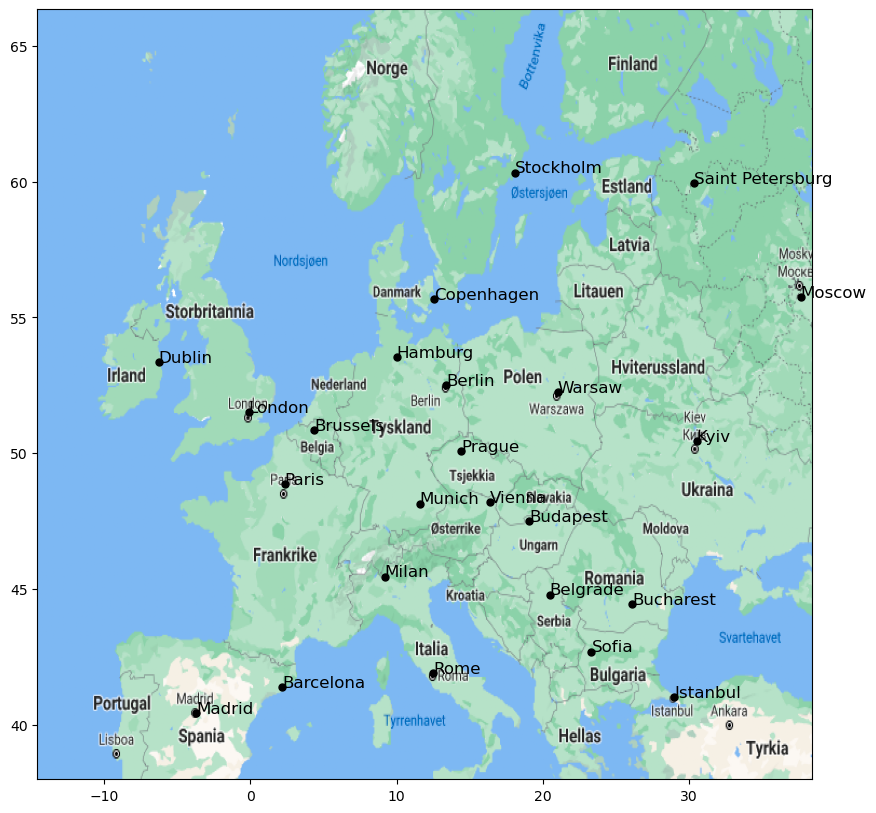

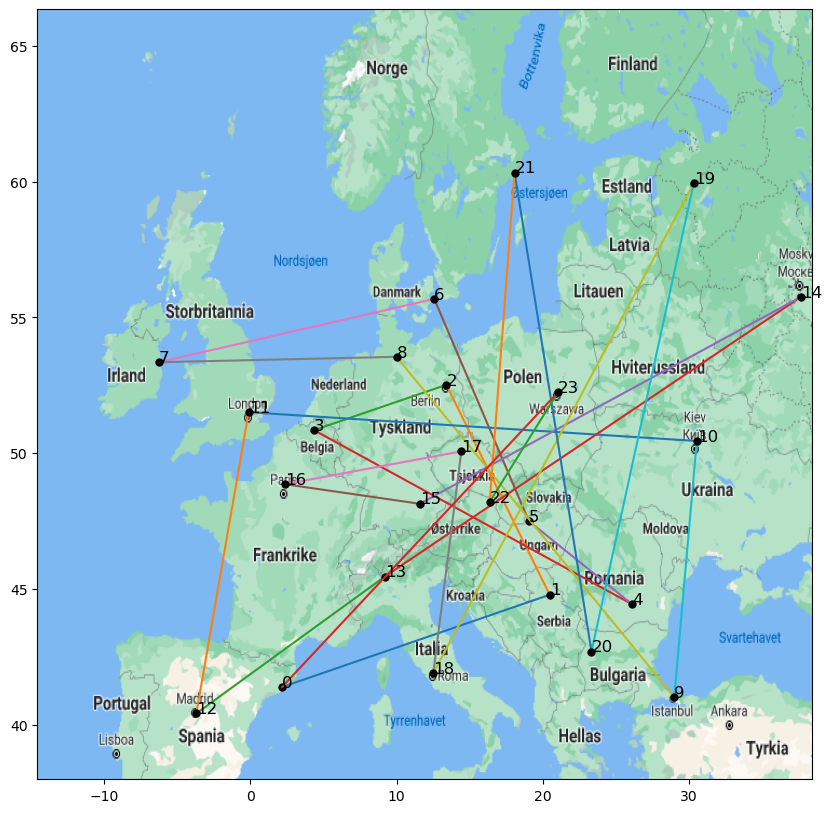

In [5]:
#Example usage of the plotting-method.
plan = list(city_coords.keys()) # Gives us the cities in alphabetic order
print(plan)
plot_plan(plan)

## Exhaustive Search
First, try to solve the problem by inspecting every possible tour. Start by writing a program to find the shortest
tour among a subset of the cities (say, **6** of them). Measure the amount of time your program takes. Incrementally
add more cities and observe how the time increases. Plot the shortest tours you found using the plot_plan method above, for 6 and 10 cities.

**Note:** To get distances between cities, use the dictionary `data` created by reading the file `european_cities.csv`. *Do not* calculate distances based on the coordinates. The actual distances do not only depend on the differences in the coordinates, but also of the curvature of the earth. The distances available in `data` are corrected for this, and contain the actual true distances.

In [6]:
from itertools import permutations

def exhaustive_src(n_cities, randomize = False):
    """
    Perform an exhaustive search algorithm to solve the Traveling Salesman Problem (TSP).

    Parameters
    ----------
    n_cities : int
        The number of cities to include in the TSP problem.
    randomize : bool, optional
        If True, select a random subset of cities (default is False).

    Returns
    -------
    tuple
        A tuple containing the best solution found and its cost.
        - min_idx : list
            The indices of the best solution found.
        - min_dist : float
            The cost of the best solution.

    Notes
    -----
    The algorithm generates all possible permutations of the cities and evaluates each one to find
    the solution with the lowest cost. This approach guarantees finding the optimal solution but
    is computationally expensive and impractical for large numbers of cities.
    """
    if randomize:
        # Optional take n random cities
        subset_index = np.random.randint(0, len(cities), n_cities)
    else:
        subset_index = np.arange(0, n_cities)

    perms = np.array(list(permutations(subset_index)))

    def procedure(perm_idx):
        tot_dist = 0
        for i in range(n_cities):
            next_city = perm_idx[((i+1) % n_cities)] + 1 # +1 to acount for the first row being the city name
            current_city = perm_idx[i]

            tot_dist += float(data[next_city][current_city])
        return tot_dist

    min_dist = np.inf        
    for perm in perms:
        new_dist = procedure(perm)
        
        if new_dist < min_dist:
            min_dist = new_dist
            min_idx = perm
            
    return min_idx, min_dist



What is the shortest tour (i.e., the actual sequence of cities, and its length) among the first 10 cities (that is,
the cities starting with B,C,D,H and I)? How long did your program take to find it? Calculate an approximation of how long it would take to perform exhaustive search on all 24 cities?

 Barcelona -> Belgrade -> Bucharest -> Budapest -> Berlin -> Brussels for a total travel distance of 5018.81 km


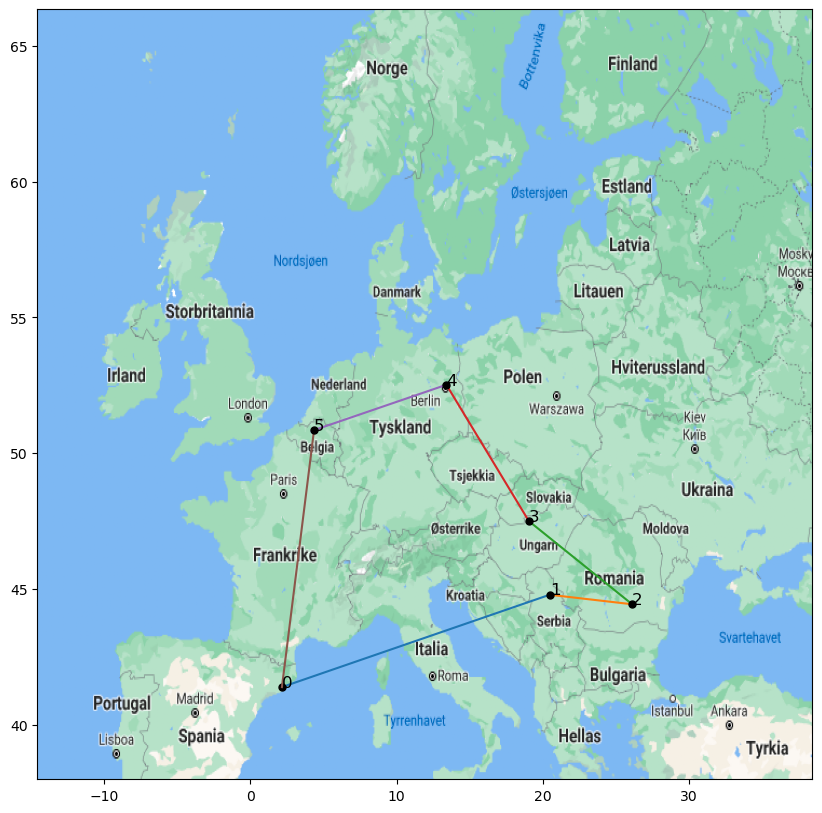

In [7]:

min_idx, min_dist = exhaustive_src(6)

min_tour = [cities[i] for i in min_idx]
print(f" {" -> ".join(min_tour)} for a total travel distance of {min_dist:.2f} km" )

plot_plan(min_tour)

 Copenhagen -> Hamburg -> Brussels -> Dublin -> Barcelona -> Belgrade -> Istanbul -> Bucharest -> Budapest -> Berlin for a total travel distance of 7486.31 km


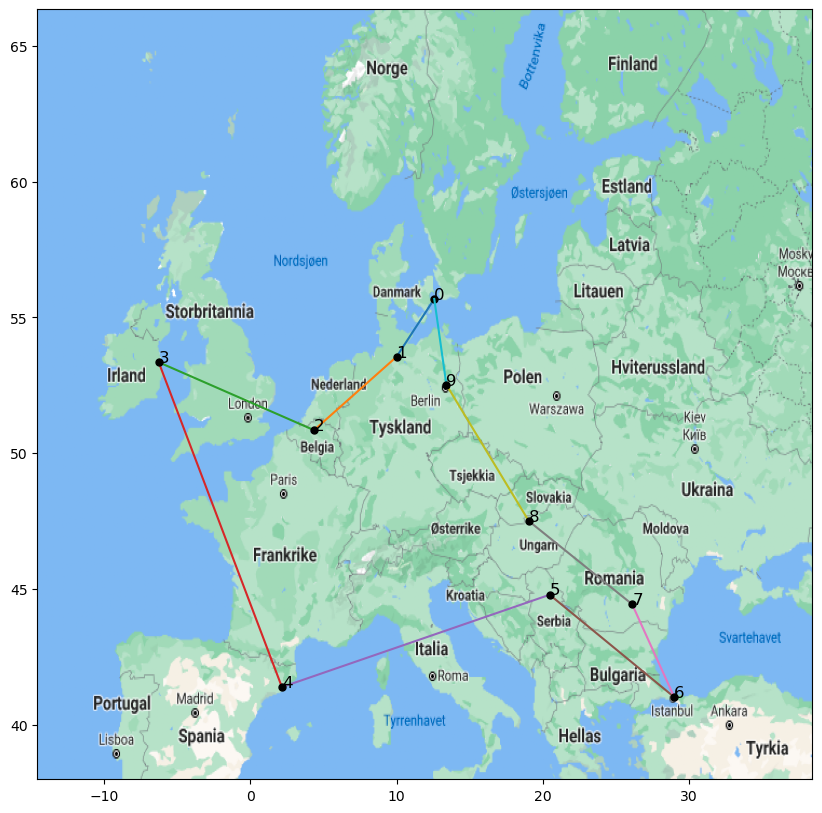

In [8]:

min_idx, min_dist = exhaustive_src(10)

min_tour = [cities[i] for i in min_idx]
print(f" {" -> ".join(min_tour)} for a total travel distance of {min_dist:.2f} km" )

plot_plan(min_tour)

The time complexity of an exhaustive search algorithm for the Traveling Salesman Problem (TSP) is factorial, specifically (O(n!)), where (n) is the number of cities. Knowing the computation time for a subset of the cities, we can exploit the following relation:
 $$ \frac{t_{24}}{n_{24}!} \approx  \frac{t_6}{n_{6}!} \Rightarrow t_{24} \approx  t_6 \times \frac{n_{24}!}{n_{6}!} $$

In [9]:
from mpl_toolkits.axes_grid1.inset_locator import inset_axes, mark_inset
from time import time

city_lengths = np.arange(6,11)
runtimes = []

for n_cities in city_lengths:
    t_1 = time()
    exhaustive_src(n_cities)
    t_2 = time()
    runtimes.append(t_2 - t_1)


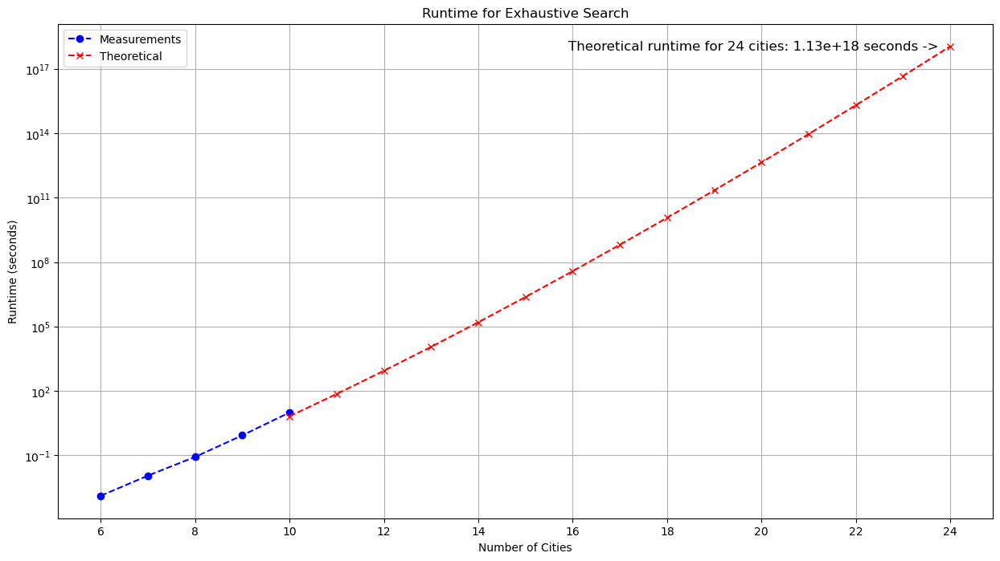

In [10]:
from math import factorial

theoretical_range = range(10,25)
theoretical_runtimes = [runtimes[0] * (factorial(i) / factorial(6)) for i in theoretical_range]
                            
fig, ax = plt.subplots(figsize=(15, 8))
ax.plot(city_lengths, runtimes, "bo--", label="Measurements")
ax.plot(theoretical_range, theoretical_runtimes, "rx--", label='Theoretical')
ax.text(23.75, theoretical_runtimes[-1]*0.65, f"Theoretical runtime for 24 cities: {theoretical_runtimes[-1]:.2e} seconds ->", color='black', fontsize=12, ha='right')
ax.set_yscale('log')
ax.xaxis.set_major_locator(plt.MaxNLocator(integer=True))
ax.grid(True)

# Create inset for zoomed view
# axins = ax.inset_axes([0.375, 0.1, 0.6, 0.65])  # [x, y, width, height]
# axins.plot(city_lengths, runtimes, "bo--")
# axins.set_xlim(5.5, 10.5)
# axins.set_ylim(0.001, 55)
# axins.set_yscale('log')
# axins.grid(True)
# axins.set_title("Zoom of Measurements")

ax.set_title("Runtime for Exhaustive Search")
ax.set_xlabel('Number of Cities')
ax.set_ylabel('Runtime (seconds)')
ax.legend()

# mark_inset(ax, axins, loc1=2, loc2=4, fc="none", ec="0.5")


plt.show()

## Hill Climbing
Then, write a simple hill climber to solve the TSP. How well does the hill climber perform, compared to the result from the exhaustive search for the first **10 cities**? Since you are dealing with a stochastic algorithm, you
should run the algorithm several times to measure its performance. Report the length of the tour of the best,
worst and mean of 20 runs (with random starting tours), as well as the standard deviation of the runs, both with the **10 first cities**, and with all **24 cities**. Plot one of the the plans from the 20 runs for both 10 cities and 24 cities (you can use plot_plan). 

In [11]:
from random import shuffle, seed, sample

def hill_climb(n_cities, randomize = False, state = None, threshold=20):
    """
    Perform a hill climbing algorithm to solve the Traveling Salesman Problem (TSP).

    Parameters
    ----------
    n_cities : int
        The number of cities to include in the TSP problem.
    randomize : bool, optional
        If True, select a random subset of cities (default is False).
    state : int or None, optional
        The seed for the random number generator (default is None).
    threshold : int, optional
        The number of neighbors checked without improvement before stopping (default is 20).

    Returns
    -------
    tuple
        A tuple containing the best solution found and its cost.
        - min_idx : list
            The indices of the best solution found.
        - min_dist : float
            The cost of the best solution.

    Notes
    -----
    The initial solution is generated by shuffling the cities. Neighbor solutions are generated
    by swapping two random cities in the current solution. The algorithm accepts a neighbor
    solution if it has a lower cost than the current solution. The algorithm stops if no
    improvement is found after a certain number of iterations. 
    The threshold is implemented as an arbitrary rule to somewhat mitigate getting stuck in local minima.
    """
    seed(state) # Seeding run for testing
    np.random.seed(state)

    if randomize:
        # Optional take n random cities
        subset_index = np.random.randint(0, len(cities), n_cities)
    else:
        subset_index = np.arange(0, n_cities)


    def procedure(idx):
        tot_dist = 0
        for i in range(n_cities):
            next_city = idx[(i+1) % n_cities] + 1 # +1 to acount for the first row being the city name
            current_city = idx[i]

            tot_dist += float(data[next_city][current_city])
        return tot_dist
    
    shuffle(subset_index)
    
    best_index = subset_index
    best_sol = procedure(best_index)
    current_index = best_index.copy()

    stagnation_counter = 0

    while stagnation_counter < threshold:
        neighbor_index = current_index.copy() # Resets the permutation to the current configuration

        i, j = sample(range(len(neighbor_index)), 2) # Select two random indices to swap
        neighbor_index[i], neighbor_index[j] = neighbor_index[j], neighbor_index[i] # Swap places between two cites
        neighbor_sol = procedure(neighbor_index)
    
        if neighbor_sol < best_sol:
            best_index = neighbor_index.copy()
            best_sol = neighbor_sol
            
            current_index = neighbor_index # Updates the current city configuration to the new best

            stagnation_counter = 0 # Resets the stagnation in case a better solution is found
        else:
            stagnation_counter += 1
    
    return best_index, best_sol

In [12]:
def eval_hill_climb(n_cities, runs, randomize=False, state=None, threshold=20):
    results = {"indices": [], "costs": []}
    t_start = time()  

    for _ in range(runs):
        min_idx, min_dist = hill_climb(n_cities, randomize=randomize, state=state, threshold=threshold)

        results["indices"].append(min_idx)
        results["costs"].append(min_dist)

    t_end = time()

    best_cost_index = np.argmin(results['costs'])
    worst_cost_index = np.argmax(results['costs'])
    
    results["best"] = results['costs'][best_cost_index]
    results["best_indices"] = results['indices'][best_cost_index]
    results["worst"] = results['costs'][worst_cost_index]
    results["worst_indices"] = results['indices'][worst_cost_index]
    
    title = f"\nReport for Hill Climber w/ {n_cities} cities"
    print(title)
    print("-"*len(title))
    print(f"Best run: {" -> ".join(cities[i] for i in results["best_indices"])} for a total travel distance of {results["best"]:.2f} km")
    print(f"Worst run: {" -> ".join(cities[i] for i in results["worst_indices"])} for a total travel distance of {results["worst"]:.2f} km")

    print(f"\nFor all {runs} runs")
    print(f"Mean: {np.mean(results['costs']):.2f} km, std: {np.std(results['costs']):.2f} km")
    print(f"Time to compute: {(t_end - t_start):.4f} seconds.")

    # Return best runs for plotting
    return results["best_indices"], results["best"]


Report for Hill Climber w/ 10 cities
-------------------------------------
Best run: Hamburg -> Copenhagen -> Berlin -> Budapest -> Bucharest -> Istanbul -> Belgrade -> Barcelona -> Dublin -> Brussels for a total travel distance of 7486.31 km
Worst run: Bucharest -> Barcelona -> Dublin -> Hamburg -> Copenhagen -> Budapest -> Berlin -> Brussels -> Belgrade -> Istanbul for a total travel distance of 9778.72 km

For all 20 runs
Mean: 8144.14 km, std: 717.42 km
Time to compute: 0.0099 seconds.

Report for Hill Climber w/ 24 cities
-------------------------------------
Best run: London -> Munich -> Prague -> Berlin -> Copenhagen -> Stockholm -> Moscow -> Saint Petersburg -> Warsaw -> Hamburg -> Vienna -> Budapest -> Kyiv -> Bucharest -> Istanbul -> Sofia -> Belgrade -> Milan -> Barcelona -> Madrid -> Paris -> Rome -> Brussels -> Dublin for a total travel distance of 16563.88 km
Worst run: Vienna -> Budapest -> Paris -> Berlin -> Saint Petersburg -> Kyiv -> Rome -> Istanbul -> Sofia -> Mila

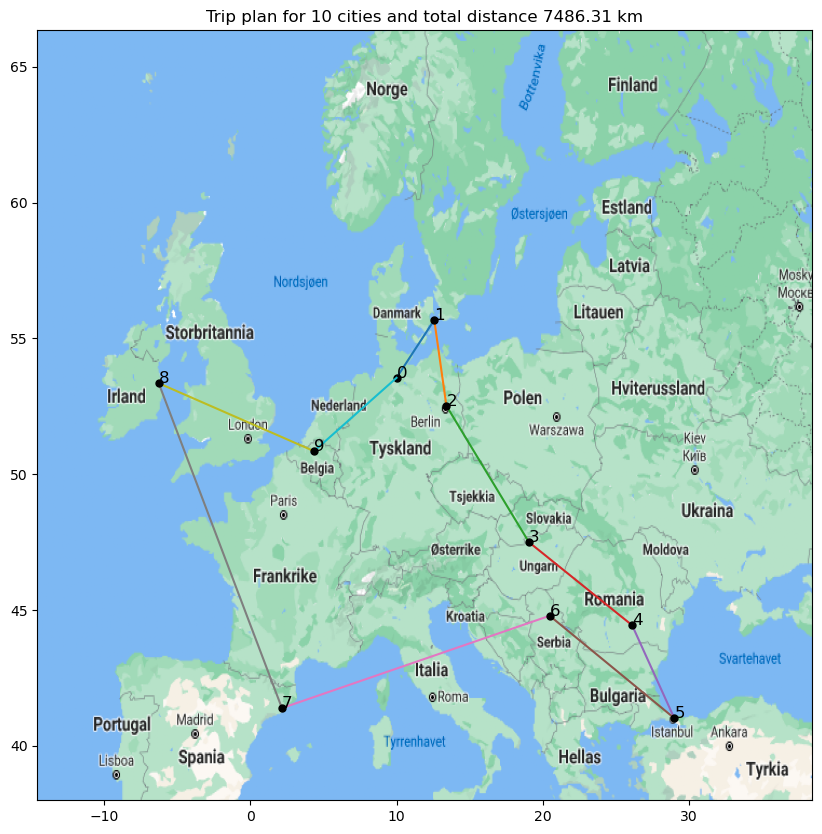

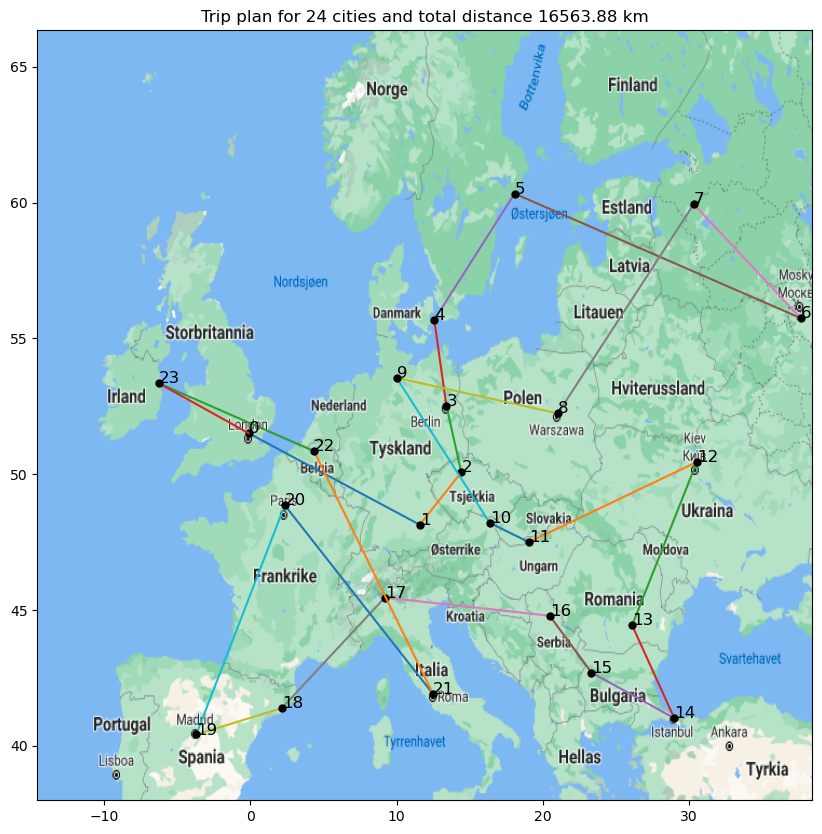

In [13]:
best_10_route, best_10_distance = eval_hill_climb(10, 20)
best_24_route, best_24_distance = eval_hill_climb(24, 20)

# Plot the best tour for 10 cities
plot_plan([cities[i] for i in best_10_route], title="hc", title_info=best_10_distance)

# Plot the best tour for 24 cities
plot_plan([cities[i] for i in best_24_route], title="hc", title_info=best_24_distance )


## Genetic Algorithm
Next, write a genetic algorithm (GA) to solve the problem. Choose mutation and crossover operators that are appropriate for the problem (see chapter 4.5 of the Eiben and Smith textbook). Choose three different values for the population size. Define and tune other parameters yourself and make assumptions as necessary (and report them, of course).

For all three variants: As with the hill climber, report best, worst, mean and standard deviation of tour length out of 20 runs of the algorithm (of the best individual of last generation). Also, find and plot the average fitness of the best fit individual in each generation (average across runs), and include a figure with all three curves in the same plot in the report. This means that the x-axis should be the generations over time and the y-axis should be the average (over the 20-runs) fitness of the best gene in that generation. Conclude which is best in terms of tour length and number of generations of evolution time.

Finally, plot an example optimized tour (the best of the final generation) for the three different population sizes, using the plot_plan method.

In [14]:
from typing import Iterable
from random import random

class GeneticTSP:
    def __init__(self, data, pop_size=50, elite_size=5, mutation_rate=0.05, generations=100):
        self.data = data
        self.pop_size = pop_size
        self.elite_size = elite_size
        self.mutation_rate = mutation_rate
        self.generations = generations
        self.best_history = []
        
    def create_initial_population(self, n_cities):
        p = permutations(list(range(n_cities)))
        population = [p.__next__() for _ in range(self.pop_size)]

        return population
    
    def fitness(self, chromosome):
        total_distance = 0

        for i in range(len(chromosome)):
            from_city = chromosome[i]
            to_city = chromosome[(i + 1) % len(chromosome)] + 1# Add 1 to account for city names row in data
            total_distance += float(self.data[to_city][from_city])

        return total_distance
    
    def tournament_selection(self, population, tournament_size=3):
        tournament = sample(population, tournament_size)
        return min(tournament, key=lambda x: self.fitness(x))
    
    def order_crossover(self, p1: Iterable, p2: Iterable) -> tuple[np.ndarray, np.ndarray]:
        def procedure(p1: Iterable, p2: Iterable):
            p1, p2 = np.array(p1), np.array(p2)
            n = len(p1)
            # Step 1
            idx1 = np.random.randint(0, n)
            idx2 = np.random.randint(0, n)
            
            # Make sure idx1 != idx2
            while idx1 == idx2:
                idx2 = np.random.randint(0, n)
            
            # Make sure idx1 alwyas refers to the smaller index
            if idx1 > idx2:
                idx2, idx1 = idx1, idx2
                
            segment = slice(idx1, idx2+1)
            
            child = np.zeros_like(p1) # Works for any data type
            child[segment] = p1[segment]
            
            # Step 2
            next_available_index = (idx2 + 1) % n
            for gene in np.roll(p2, -idx2 - 1): # Aligns the gene after idx2 to the beginning
                if gene not in child:
                    child[next_available_index % n] = gene
                    next_available_index += 1

            return child 
        
        child1 = procedure(p1, p2)
        child2 = procedure(p2, p1)
        
        return child1, child2
    
    def mutate(self, chromosome):
        if random() < self.mutation_rate:
            i, j = sample(range(len(chromosome)), 2)
            chromosome[i], chromosome[j] = chromosome[j], chromosome[i]
        return chromosome
    
    def evolve_population(self, population):
        # Sort population by fitness
        population.sort(key=lambda x: self.fitness(x))
        
        # Keep elite individuals
        new_population = population[:self.elite_size]
        
        # Generate rest of new population
        while len(new_population) < self.pop_size - 1:  # -1 because we'll add 2 children at a time
            parent1 = self.tournament_selection(population)
            parent2 = self.tournament_selection(population)

            child1, child2 = self.order_crossover(parent1, parent2)
            
            child1 = self.mutate(child1)
            child2 = self.mutate(child2)
            
            new_population.append(child1)
            if len(new_population) < self.pop_size:
                new_population.append(child2)
                
        
        return new_population
    
    def run(self, n_cities):
        population = self.create_initial_population(n_cities)
        
        for _ in range(self.generations):
            population = self.evolve_population(population)
            best_fitness = self.fitness(population[0])
            self.best_history.append(best_fitness)
            
        return population[0], self.best_history


In [15]:
def run_ga_experiment(n_cities, pop_sizes, n_runs=20):
    results = {}
    
    for pop_size in pop_sizes:
        print(f"\nRunning GA with population size {pop_size}")
        run_results = {
            "best_tours": [],
            "best_distances": [],
            "histories": []
        }
        
        for run in range(n_runs):
            ga = GeneticTSP(data, pop_size=pop_size)
            best_tour, history = ga.run(n_cities)
            distance = ga.fitness(best_tour)
            
            run_results["best_tours"].append(best_tour)
            run_results["best_distances"].append(distance)
            run_results["histories"].append(history)
        
        results[pop_size] = {
            "best": min(run_results["best_distances"]),
            "worst": max(run_results["best_distances"]),
            "mean": np.mean(run_results["best_distances"]),
            "std": np.std(run_results["best_distances"]),
            "best_tour": run_results["best_tours"][np.argmin(run_results["best_distances"])],
            "histories": run_results["histories"]
        }
        
        print(f"Best: {results[pop_size]['best']:.2f} km")
        print(f"Worst: {results[pop_size]['worst']:.2f} km")
        print(f"Mean: {results[pop_size]['mean']:.2f} km")
        print(f"Std: {results[pop_size]['std']:.2f} km")
    
    return results

def plot_convergence(results, pop_sizes):
    plt.figure(figsize=(10, 6))
    for pop_size in pop_sizes:
        histories = results[pop_size]["histories"]
        avg_history = np.mean(histories, axis=0)
        plt.plot(avg_history, label=f"Population Size {pop_size}")
    
    plt.xlabel("Generation")
    plt.ylabel("Best Tour Distance (km)")
    plt.title("Convergence of Different Population Sizes")
    plt.legend()
    plt.grid(True)
    plt.show()

In [16]:
def run_ga_experiment(n_cities, pop_sizes, n_runs=20):
    results = {}
    

    for pop_size in pop_sizes:
        print(f"\nRunning GA with population size {pop_size}")
        run_results = {
            "best_tours": [],
            "best_distances": [],
            "histories": []
        }

        t_start = time()
        for _ in range(n_runs):
            ga = GeneticTSP(data, pop_size=pop_size)
            best_tour, history = ga.run(n_cities)
            distance = ga.fitness(best_tour)
            
            run_results["best_tours"].append(best_tour)
            run_results["best_distances"].append(distance)
            run_results["histories"].append(history)
        t_end = time()

        results[pop_size] = {
            "best": min(run_results["best_distances"]),
            "worst": max(run_results["best_distances"]),
            "mean": np.mean(run_results["best_distances"]),
            "std": np.std(run_results["best_distances"]),
            "best_tour": run_results["best_tours"][np.argmin(run_results["best_distances"])],
            "worst_tour": run_results["best_tours"][np.argmax(run_results["best_distances"])],
            "histories": run_results["histories"],
            "runtime": t_end - t_start

        }
    
    return results

def plot_convergence(results, pop_sizes):
    plt.figure(figsize=(10, 6))
    for pop_size in pop_sizes:
        histories = results[pop_size]["histories"]
        avg_history = np.mean(histories, axis=0)
        plt.plot(avg_history, label=f"Population Size {pop_size}")
    
    plt.xlabel("Generation")
    plt.ylabel("Best Tour Distance (km)")
    plt.title("Convergence of Different Population Sizes")
    plt.legend()
    plt.grid(True)
    plt.show()

def ge_report(results, n_cities, pop_sizes, n_runs):
    for population in pop_sizes:
        best_tour = results[population]["best_tour"]
        worst_tour = results[population]["worst_tour"]

        title = f"\nReport for Genetic Algorithm w/ {n_cities} cities and population {population}"
        print(title)
        print("-"*len(title))
        print(f"Best run: {' -> '.join(cities[i] for i in best_tour)} for a total travel distance of {results[population]['best']:.2f} km")
        print(f"Worst run: {' -> '.join(cities[i] for i in worst_tour)} for a total travel distance of {results[population]['worst']:.2f} km")
        print(f"\nFor all {n_runs} runs")
        print(f"Mean: {results[population]['mean']:.2f} km, Std: {results[population]['std']:.2f} km")
        print(f"Time to compute: {results[population]['runtime']:.4f} seconds.")

### Genetic Algorithm for 10 cities

Running experiments with 10 cities...

Running GA with population size 15

Running GA with population size 30

Running GA with population size 50

Report for Genetic Algorithm w/ 10 cities and population 15
------------------------------------------------------------
Best run: Berlin -> Copenhagen -> Hamburg -> Brussels -> Dublin -> Barcelona -> Belgrade -> Istanbul -> Bucharest -> Budapest for a total travel distance of 7486.31 km
Worst run: Berlin -> Belgrade -> Budapest -> Brussels -> Hamburg -> Copenhagen -> Dublin -> Barcelona -> Istanbul -> Bucharest for a total travel distance of 9902.02 km

For all 20 runs
Mean: 8352.82 km, Std: 842.92 km
Time to compute: 0.7359 seconds.

Report for Genetic Algorithm w/ 10 cities and population 30
------------------------------------------------------------
Best run: Istanbul -> Bucharest -> Budapest -> Berlin -> Copenhagen -> Hamburg -> Brussels -> Dublin -> Barcelona -> Belgrade for a total travel distance of 7486.31 km
Worst run: Brussels ->

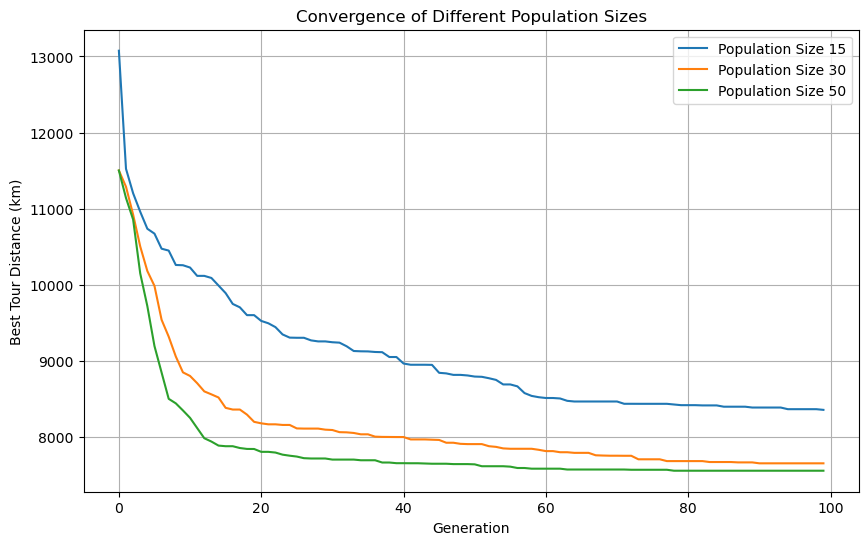

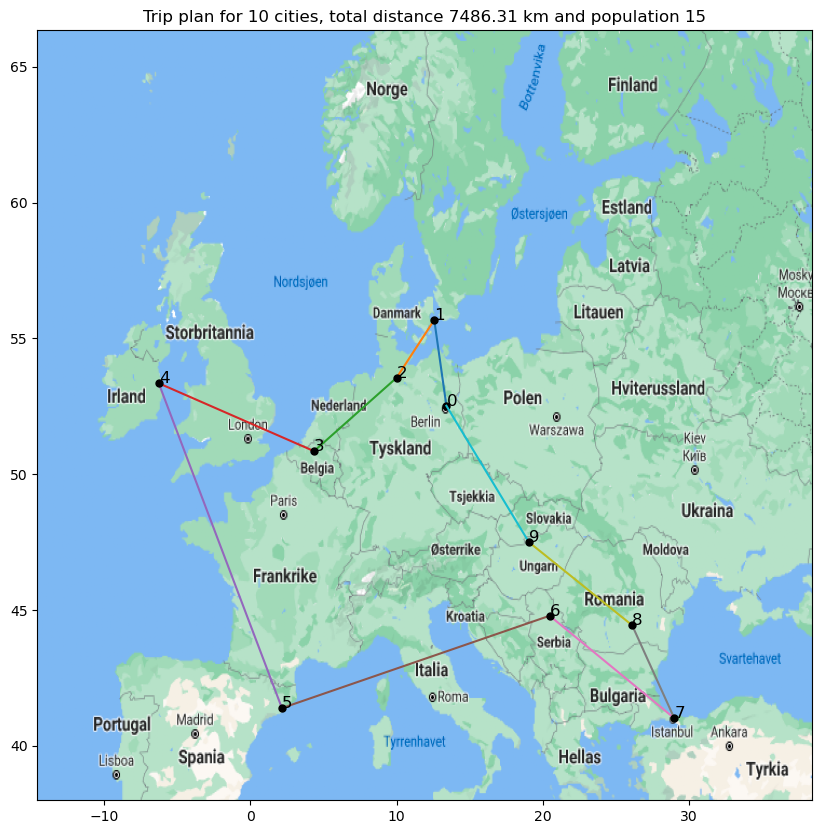

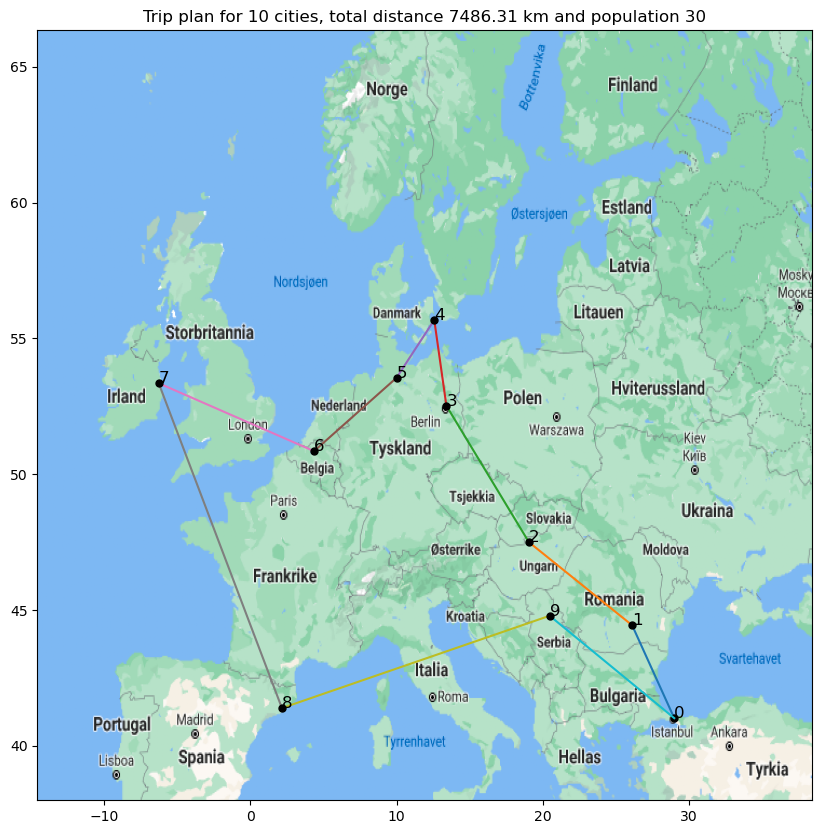

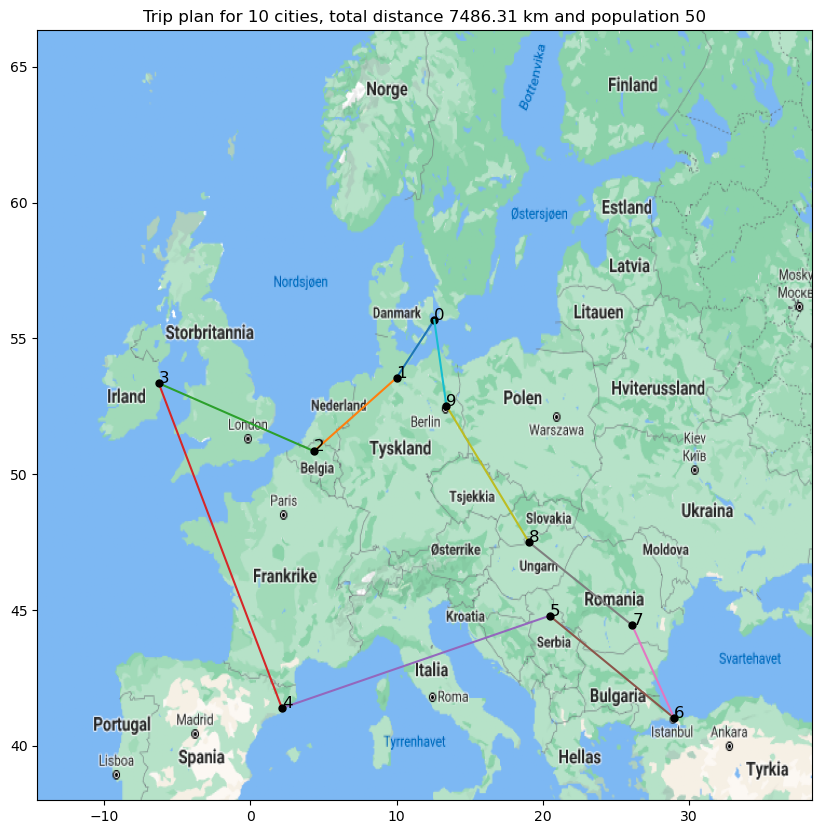

In [17]:
n_cities = 10
n_runs = 20
pop_sizes = [15, 30, 50]

print("Running experiments with 10 cities...")

results_10 = run_ga_experiment(n_cities, pop_sizes=pop_sizes)
ge_report(results_10, n_cities, pop_sizes, n_runs)

# Plot convergence for 10 cities
plot_convergence(results_10, pop_sizes)

# Plot best tours for each population size
for pop_size in pop_sizes:
    best_tour = results_10[pop_size]["best_tour"]
    best_distance = results_10[pop_size]["best"]
    tour_cities = [cities[i] for i in best_tour]
    plot_plan(tour_cities, title="ge", title_info=[best_distance, pop_size])


### Genetic Algorithm for 24 cities


Running experiments with 24 cities...

Running GA with population size 30

Running GA with population size 50

Running GA with population size 100

Report for Genetic Algorithm w/ 24 cities and population 30
------------------------------------------------------------
Best run: Kyiv -> Moscow -> Saint Petersburg -> Stockholm -> Copenhagen -> Berlin -> Hamburg -> Dublin -> London -> Brussels -> Paris -> Madrid -> Barcelona -> Milan -> Munich -> Rome -> Prague -> Warsaw -> Vienna -> Budapest -> Bucharest -> Sofia -> Belgrade -> Istanbul for a total travel distance of 13993.25 km
Worst run: Prague -> Copenhagen -> Dublin -> London -> Hamburg -> Warsaw -> Moscow -> Kyiv -> Budapest -> Vienna -> Paris -> Madrid -> Barcelona -> Milan -> Munich -> Rome -> Istanbul -> Saint Petersburg -> Stockholm -> Brussels -> Berlin -> Bucharest -> Sofia -> Belgrade for a total travel distance of 19937.32 km

For all 20 runs
Mean: 17230.17 km, Std: 1458.52 km
Time to compute: 4.2231 seconds.

Report for Ge

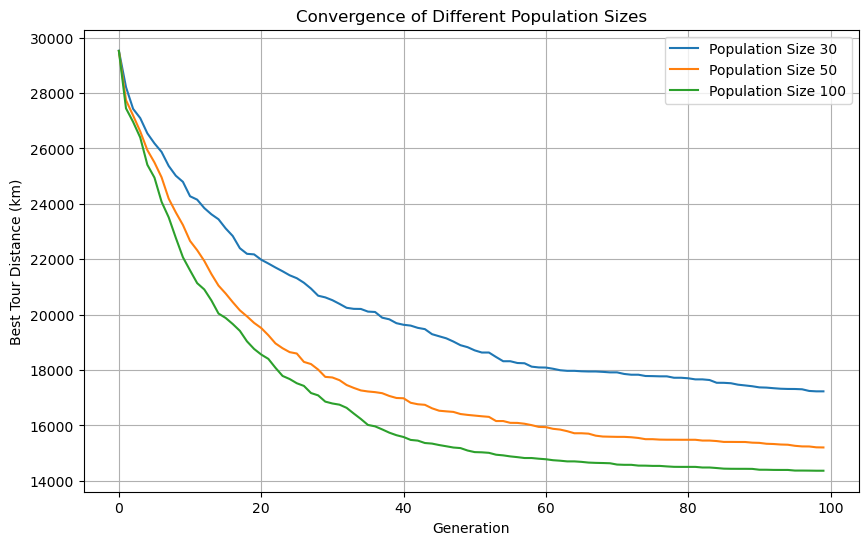

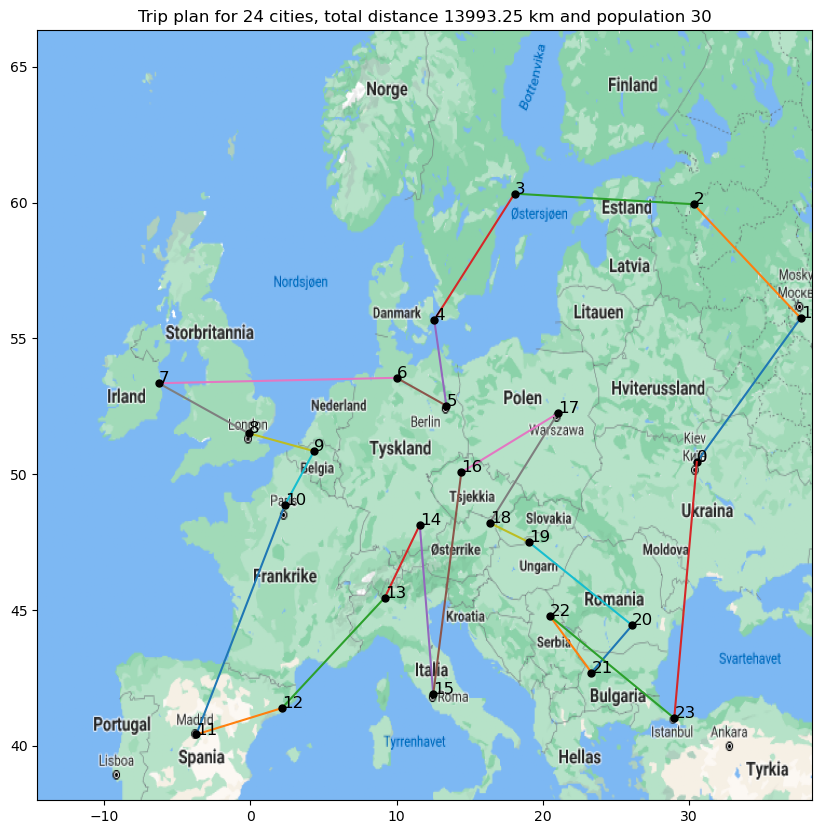

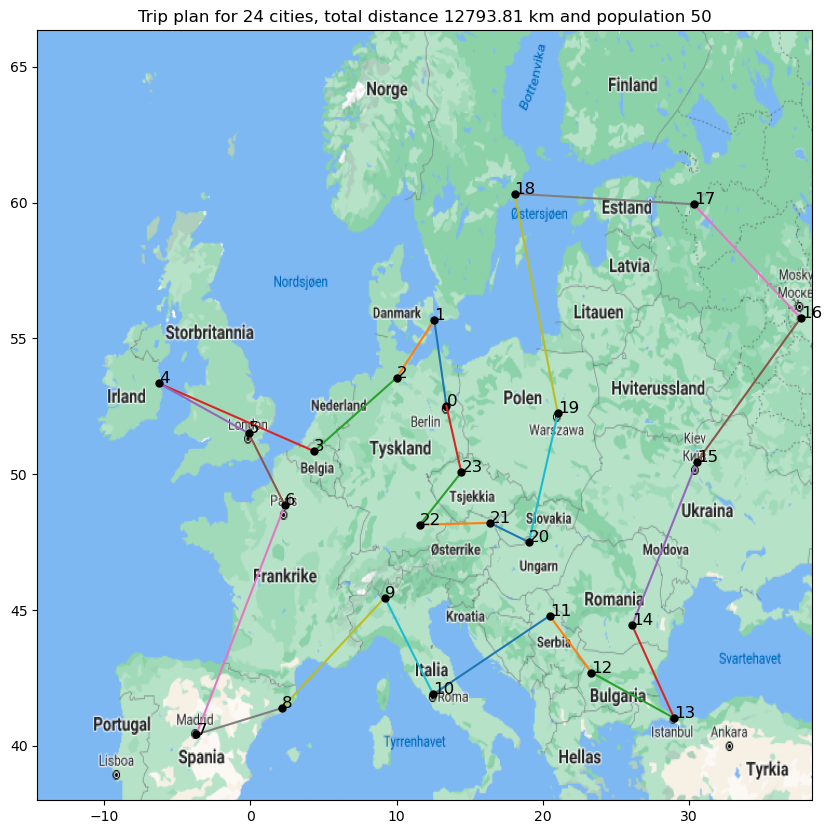

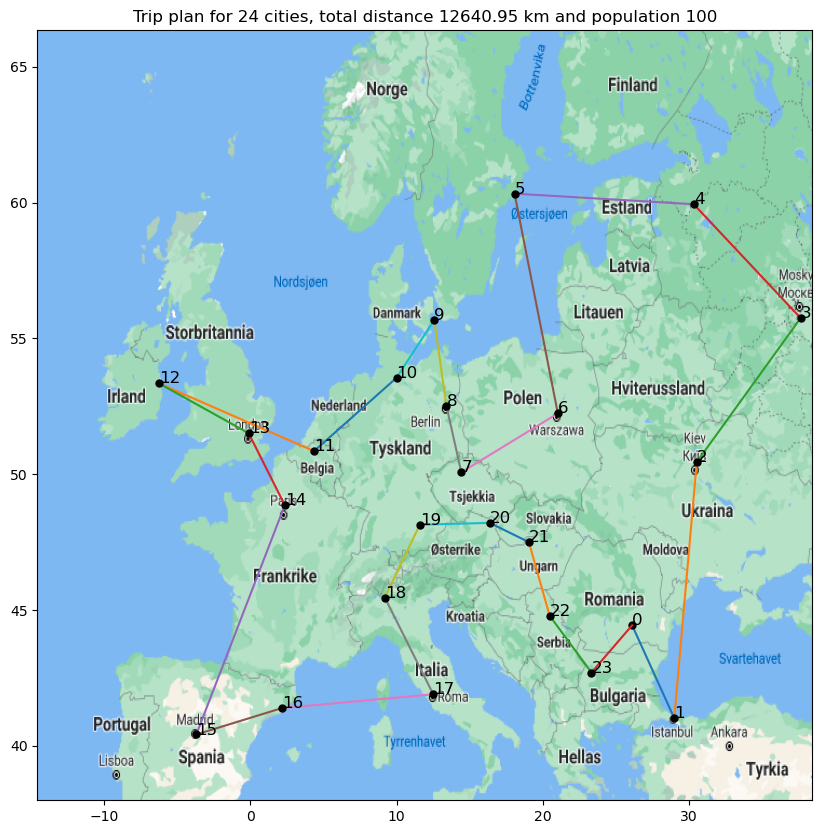

In [18]:
n_cities = 24
n_runs = 20
pop_sizes = [30, 50, 100]

print("\nRunning experiments with 24 cities...")
results_24 = run_ga_experiment(24, pop_sizes=pop_sizes)
ge_report(results_24, 24, pop_sizes, n_runs)
# Plot convergence for 24 cities
plot_convergence(results_24, pop_sizes)

# Plot best tours for each population size
for pop_size in pop_sizes:
    best_tour = results_24[pop_size]["best_tour"]
    best_distance = results_24[pop_size]["best"]
    tour_cities = [cities[i] for i in best_tour]
    plot_plan(tour_cities, title="ge", title_info=[best_distance, pop_size])

Among the first 10 cities, did your GA find the shortest tour (as found by the exhaustive search)? Did it come close? 

For both 10 and 24 cities: How did the running time of your GA compare to that of the exhaustive search? 

How many tours were inspected by your GA as compared to by the exhaustive search?

# Discussion

The following parameters were used for the genetic algorithm:
- Population size: 15, 30, 50, 100
    - The former three were used for the 10 cities, and the latter three for the 24 cities.
- Number of generations: 100
- Ordered crossover
- Swap mutation (with a probability of 0.05)
- Elitism: 5
- Tournament selection with a tournament size of 3

From the results we can see that for 10 cities, the genetic algorithm was able to find the shortest tour as indicated på exhaustive search, in 30 generations.
The runtime for the genetic algorithm was significantly lower than that of the exhaustive search.

For ten cities, the genetic algorithm inspects $n_{\text{population}} \times n_{\text{generation}} $ tours, which is significantly lower than the $n!$ tours inspected by the exhaustive search. Respectively this then becomes $50 \times 100 = 5000$ and $10! = 3628800$ for 10 cities, and $100 \times 100 = 10000$ and $24! = 620448401733239439360000$ for 24 cities. 

## Hybrid Algorithm (IN4050 only)
### Lamarckian
Lamarck, 1809: Traits acquired in parents’ lifetimes can be inherited by offspring. In general the algorithms are referred to as Lamarckian if the result of the local search stage replaces the individual in the population.
### Baldwinian
Baldwin effect suggests a mechanism whereby evolutionary progress can be guided towards favourable adaptation without the changes in individual's fitness arising from learning or development being reflected in changed genetic characteristics. In general the algorithms are referred to as Baldwinian if the original member is kept, but has as its fitness the value belonging to the outcome of the local search process.


(See chapter 10 and 10.2.1 from Eiben and Smith textbook for more details. It will also be lectured in Lecure 3)

### Task
Implement a hybrid algorithm to solve the TSP: Couple your GA and hill climber by running the hill climber a number of iterations on each individual in the population as part of the evaluation. Test both Lamarckian and Baldwinian learning models and report the results of both variants in the same way as with the pure GA (min,
max, mean and standard deviation of the end result and an averaged generational plot). How do the results compare to that of the pure GA, considering the number of evaluations done?

In [19]:
class HybridTSP(GeneticTSP):
    def __init__(self, data, pop_size=50, elite_size=5, mutation_rate=0.05, generations=100,
                 hc_iterations=10, learning_type='lamarckian'):
        super().__init__(data, pop_size, elite_size, mutation_rate, generations)
        self.hc_iterations = hc_iterations
        self.learning_type = learning_type
        self.best_history = []

    def hill_climb_individual(self, chromosome):
        """Apply hill climbing to a single chromosome"""
        best_index = list(chromosome)
        best_sol = self.fitness(best_index)
        current_index = best_index.copy()

        for _ in range(self.hc_iterations):
            neighbor_index = current_index.copy() # Resets the permutation to the current configuration
            i, j = sample(range(len(neighbor_index)), 2) # Select two random indices to swap
            neighbor_index[i], neighbor_index[j] = neighbor_index[j], neighbor_index[i] # Swap places between two cites
            neighbor_sol = self.fitness(neighbor_index)

            if neighbor_sol < best_sol:
                best_index = neighbor_index.copy()
                best_sol = neighbor_sol
                
                current_index = neighbor_index # Updates the current city configuration to the new best
        
        return best_index, best_sol
    
    
    def tournament_selection(self, population, fitness_value, tournament_size=3):
        """ Modified tournament with fitness as kwarg """
        tournament_indices = sample(range(len(population)), tournament_size)
        tournament = [population[i] for i in tournament_indices]
        tournament_fitness = [fitness_value[i] for i in tournament_indices]
        
        return tournament[np.argmin(tournament_fitness)]

    def eval_population(self, population):
        """Evaluate population using either Lamarckian or Baldwinian learning"""
        evaluated_pop = []
        fitness_value = []

        for individual in population:
            improved_individual, improved_fitness = self.hill_climb_individual(individual)

            if self.learning_type == 'lamarckian':
                evaluated_pop.append(improved_individual)
            elif self.learning_type == 'baldwinian':
                evaluated_pop.append(individual)
            else:
                print("ERROR: Learning type must be 'lamarckian' or 'baldwinian")
            
            fitness_value.append(improved_fitness)

        return evaluated_pop, fitness_value

    def evolve_population(self, population):
        """Modified evolution process w/ local search"""
        population, fitness_value = self.eval_population(population) # Evaluate population with local search

        # Sort population and fitness_value based on fitness_value
        sorted_indices = np.argsort(fitness_value)
        population = [population[i] for i in sorted_indices]
        fitness_value = [fitness_value[i] for i in sorted_indices]

        # Keep elite individuals
        new_population = population[:self.elite_size]
        
        # Generate rest of new population
        while len(new_population) < self.pop_size - 1:  # -1 because we'll add 2 children at a time
            parent1 = self.tournament_selection(population, fitness_value)
            parent2 = self.tournament_selection(population, fitness_value)

            child1, child2 = self.order_crossover(parent1, parent2)
            
            child1 = self.mutate(child1)
            child2 = self.mutate(child2)
            
            new_population.append(child1)
            if len(new_population) < self.pop_size:
                new_population.append(child2)
                
        return new_population



In [20]:
def run_hybrid_experiment(n_cities, pop_sizes, n_runs=20, hc_iterations=10):
    results = {}
    
    for learning_type in ['lamarckian', 'baldwinian']:
        print(f"\nRunning Hybrid GA ({learning_type}) experiments...")
        type_results = {}
        
        for pop_size in pop_sizes:
            print(f"\nPopulation size {pop_size}")
            run_results = {"best_tours": [],
                "best_distances": [],
                "histories": []
            }
            
            t_start = time()
            for _ in range(n_runs):
                ha = HybridTSP(data, pop_size=pop_size, hc_iterations=hc_iterations, 
                             learning_type=learning_type)
                best_tour, history = ha.run(n_cities)
                distance = ha.fitness(best_tour)
                
                run_results["best_tours"].append(best_tour)
                run_results["best_distances"].append(distance)
                run_results["histories"].append(history)
            t_end = time()
            
            type_results[pop_size] = {
                "best": min(run_results["best_distances"]),
                "worst": max(run_results["best_distances"]),
                "mean": np.mean(run_results["best_distances"]),
                "std": np.std(run_results["best_distances"]),
                "best_tour": run_results["best_tours"][np.argmin(run_results["best_distances"])],
                "worst_tour": run_results["best_tours"][np.argmax(run_results["best_distances"])],
                "histories": run_results["histories"],
                "runtime": t_end - t_start
            }
        
        results[learning_type] = type_results
    
    return results


In [21]:
# Test with 24 cities
n_cities = 24
pop_sizes = [30, 50, 100]
hybrid_results = run_hybrid_experiment(n_cities, pop_sizes, n_runs=20, hc_iterations=10)


Running Hybrid GA (lamarckian) experiments...

Population size 30

Population size 50

Population size 100

Running Hybrid GA (baldwinian) experiments...

Population size 30

Population size 50

Population size 100


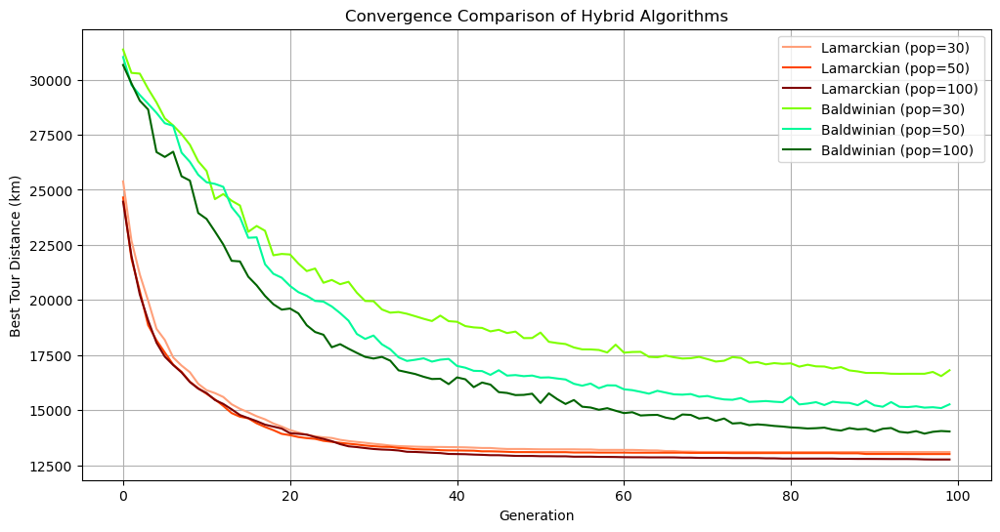


Results for Baldwinian learning with population 30:
----------------------------------------------------
Best: 14627.35 km
Worst: 19602.34 km
Mean: 16809.14 km ± 1486.63 km
Runtime: 5.19 seconds

Results for Baldwinian learning with population 50:
----------------------------------------------------
Best: 13241.31 km
Worst: 19317.27 km
Mean: 15262.47 km ± 1427.92 km
Runtime: 8.76 seconds

Results for Baldwinian learning with population 100:
-----------------------------------------------------
Best: 12487.41 km
Worst: 15866.55 km
Mean: 14031.51 km ± 956.62 km
Runtime: 18.25 seconds

Results for Lamarckian learning with population 30:
----------------------------------------------------
Best: 12325.93 km
Worst: 14133.00 km
Mean: 13098.32 km ± 463.28 km
Runtime: 5.09 seconds

Results for Lamarckian learning with population 50:
----------------------------------------------------
Best: 12325.93 km
Worst: 13943.93 km
Mean: 13006.32 km ± 482.85 km
Runtime: 8.90 seconds

Results for Lamarck

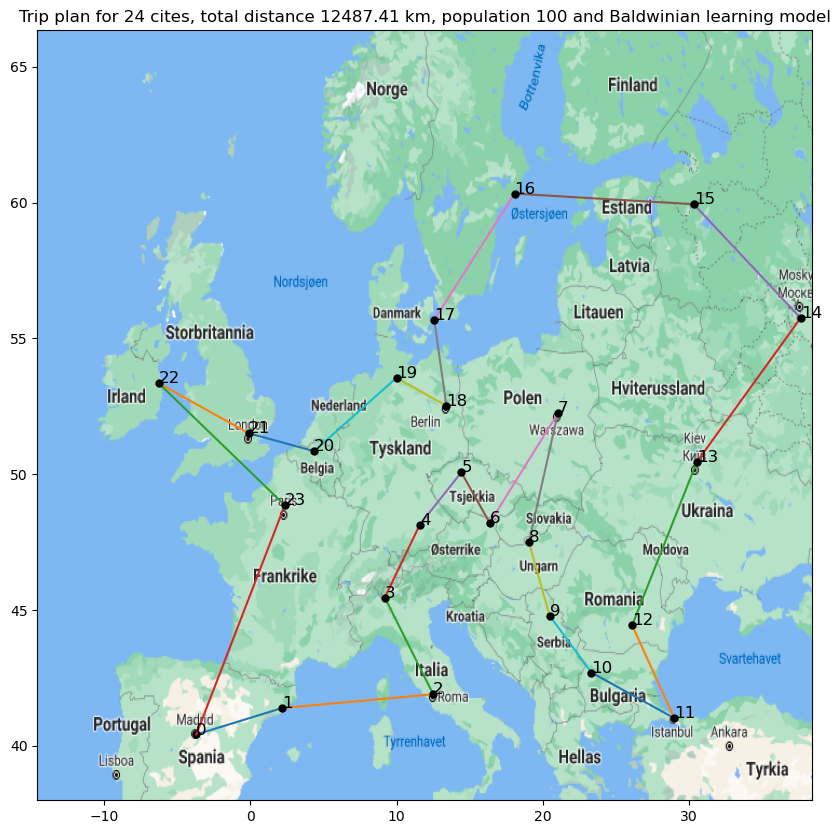

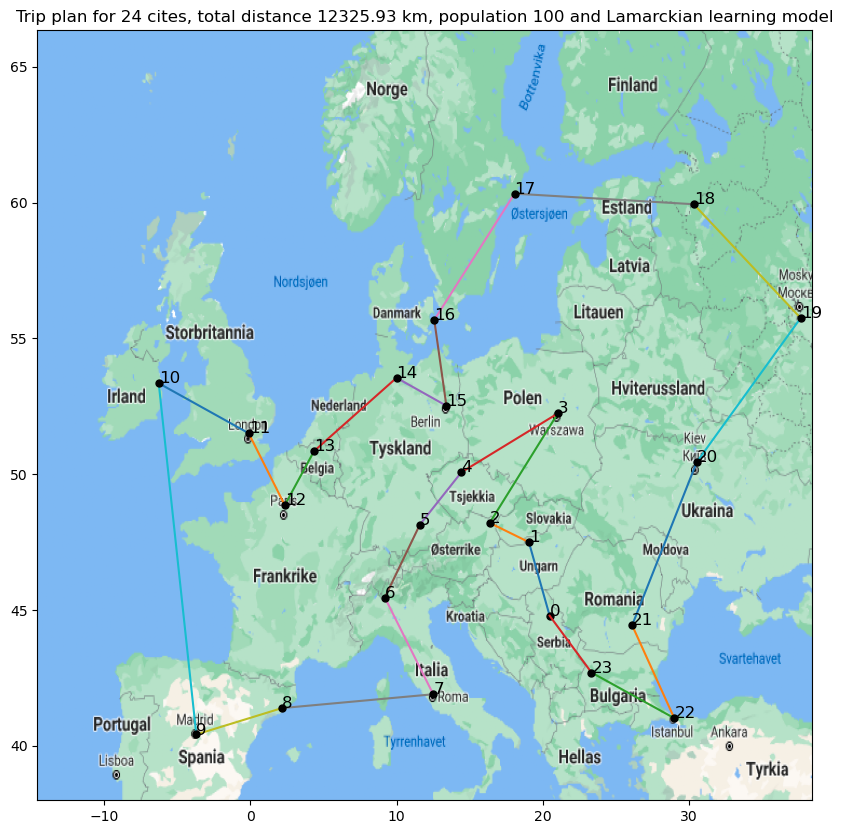

In [22]:
# Plot convergence comparison
colors = ["lightsalmon", "orangered", "maroon", "chartreuse", "mediumspringgreen", "darkgreen"]

plt.figure(figsize=(12, 6))
i = 0
for learning_type in['lamarckian', 'baldwinian']:
    for pop_size in pop_sizes:
        histories = hybrid_results[learning_type][pop_size]["histories"]
        avg_history = np.mean(histories, axis=0)
        plt.plot(avg_history, label=f"{learning_type.capitalize()} (pop={pop_size})", color=colors[i])
        i += 1

plt.xlabel("Generation")
plt.ylabel("Best Tour Distance (km)")
plt.title("Convergence Comparison of Hybrid Algorithms")
plt.legend()
plt.grid(True)
plt.show()

learning_types = ['baldwinian', 'lamarckian']

# Report results
for learning_type in learning_types:
    for pop_size in pop_sizes:
        results = hybrid_results[learning_type][pop_size]
        title = f"\nResults for {learning_type.capitalize()} learning with population {pop_size}:"
        print(title)
        print("-" * len(title))
        print(f"Best: {results['best']:.2f} km")
        print(f"Worst: {results['worst']:.2f} km")
        print(f"Mean: {results['mean']:.2f} km ± {results['std']:.2f} km")
        print(f"Runtime: {results['runtime']:.2f} seconds")

# Plot best tours for each learning model
for learning_type in learning_types:
    results = hybrid_results[learning_type][100]  # Get results for population size 100
    best_tour = results['best_tour']   # Get the tour route - this was 'best' before
    best_distance = results['best']    # Get the distance
    tour_cities = [cities[i] for i in best_tour]
    plot_plan(tour_cities, title="he", title_info=[best_distance, 100, learning_type])


# Discussion

Based on the results, the Lamarckian hybrid algorithm consistently outperformed both the pure GA and Baldwinian approach, achieving the shortest tour distances with a best result of 12,287.07 km compared to 12,679.87 km for pure GA, though at the cost of higher computational time due to the additional hill climbing evaluations. The convergence plots show that Lamarckian learning leads to faster convergence and better final solutions across all population sizes, while the Baldwinian approach has no noticeable effect on performance compared to pure genetic algorithm.